# Trip Diary: Summary Notebook

In [54]:
# Trip CSV Summary Notebook
# @author Billy Charlton <charlton@vsp.tu-berlin.de>

import pandas as pd
import panel as pn
import numpy as np
from dfply import *
from bokeh.io import output_notebook, output_file, show
from bokeh.plotting import figure
from bokeh.models import BasicTickFormatter
simple_axis = BasicTickFormatter(use_scientific=False)

# this directs all output graphics to the notebook itself instead of PNG files/etc
output_notebook()
pn.extension()

Loading BokehJS ...

## CSV File Input

In [49]:
input_file_entry = pn.widgets.TextInput(name='CSV Trip File:', value='output/trips.csv')
input_file_entry


TextInput(name='CSV Trip File:', value='output/trips.csv')

In [59]:
# Read CSV and calculate some useful columns we'll need
input_file = input_file_entry.value

trips = pd.read_csv(input_file, comment='#')

trips >>= mutate(
     duration = X.finishTime - X.time,
     dep_time_hours = X.time / 3600,
     dep_time_minutes = (X.time / 60).astype('int')
)

trips

,time,x,y,finishTime,finishX,finishY,distance,personId,duration,dep_time_hours,dep_time_minutes
0,60.0,7.45120,46.95834,130.0,7.44850,46.96077,339.122813,3254050,70.0,0.016667,1
1,60.0,8.48604,47.19241,163.0,8.48237,47.19761,641.028250,2839389,103.0,0.016667,1
2,60.0,6.13369,46.21864,193.0,6.13888,46.21079,960.118293,7783867,133.0,0.016667,1
3,60.0,7.57181,47.16355,259.0,7.57681,47.17080,890.650801,4630896,199.0,0.016667,1
4,60.0,9.25900,47.41776,341.0,9.27082,47.43924,2549.430956,2754087,281.0,0.016667,1
...,...,...,...,...,...,...,...,...,...,...,...
310265,92299.0,8.44938,47.27480,97053.0,7.49110,46.97371,80048.856262,3387441,4754.0,25.638611,1538
310266,95161.0,8.60064,47.63674,97229.0,8.54026,47.60959,5451.017381,203643,2068.0,26.433611,1586
310267,89233.0,7.88724,46.29108,98848.0,8.36488,47.51787,141156.166886,2248473,9615.0,24.786944,1487
310268,84960.0,9.83742,46.48507,99027.0,7.06093,46.61239,213405.434576,4263862,14067.0,23.600000,1416


## Summary stats

In [57]:
# Some basic summary values
print('Number of activities: ', len(trips))
print('Number of people: ', trips.personId.value_counts().size)

print('\nDistance metrics:')
trips['duration'].describe()

Number of activities:  475114
Number of people:  80023

Distance metrics:


count    475114.000000
mean        880.520542
std        1521.230223
min           0.000000
25%         195.000000
50%         474.000000
75%        1015.000000
max       61395.000000
Name: duration, dtype: float64

In [43]:
p = figure(title="Trips: Distance vs. Time of Day", plot_width=900, plot_height=600)
p.xaxis.formatter = simple_axis
p.yaxis.formatter = simple_axis
p.xgrid.grid_line_color = None
p.xaxis.axis_label = "Hour"

p.circle(trips.dep_time_hours, trips.distance, size=2, alpha=0.3, color='#333399')
show(p)

## Start location of trips

In [100]:
from bokeh.palettes import Viridis256
from bokeh.util.hex import hexbin

bins = hexbin(trips.x, trips.y, 0.04)

# color map the bins by hand - linear for now
color = [Viridis256[int(i)] for i in bins.counts/max(bins.counts)*255]

# match_aspect ensures neither dimension is squished, regardless of the plot size
p = figure(width=900, tools="wheel_zoom,reset", match_aspect=True, background_fill_color='#111111')
p.grid.visible = False

r = p.hex_tile(bins.q, bins.r, size=0.1, line_color=None, fill_color=color)

p.add_tools(HoverTool(
    tooltips=[("count", "@c")],
    mode="mouse", point_policy="follow_mouse", renderers=[r]
))

show(p)

## Trip Departure Time

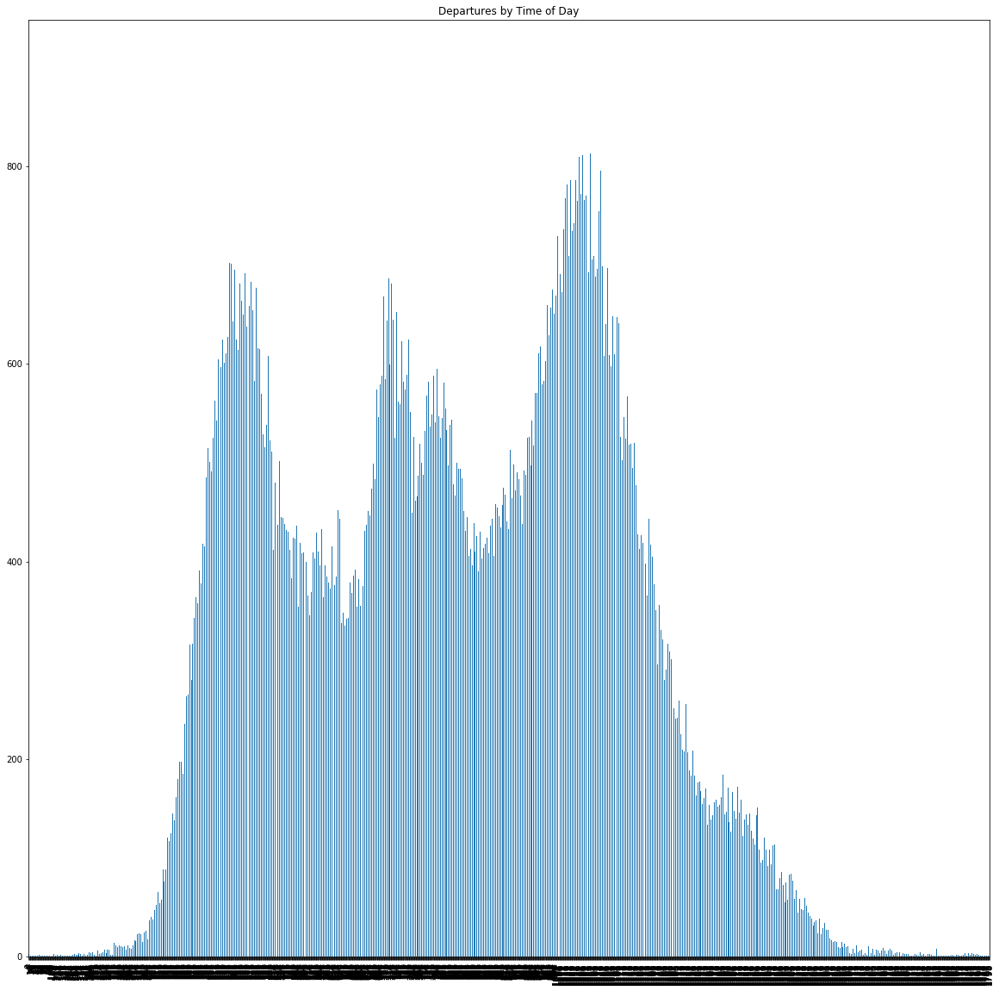

In [37]:
counts = trips['dep_time_minutes'].value_counts().sort_index()
counts.plot(kind="bar", figsize=(20,20), title="Departures by Time of Day")

In [25]:
# This function came from a tutorial. 
# https://towardsdatascience.com/interactive-histograms-with-bokeh-202b522265f3
from bokeh.models import ColumnDataSource, HoverTool, Panel
from bokeh.models.widgets import Tabs

def hist_hover(dataframe, column, colors=["SteelBlue", "Tan"], bins=30, log_scale=False, show_plot=True):

    # build histogram data with Numpy
    hist, edges = np.histogram(dataframe[column], bins = bins)
    hist_df = pd.DataFrame({column: hist,
                             "left": edges[:-1],
                             "right": edges[1:]})
    hist_df["interval"] = ["%d to %d" % (left, right) for left, 
                           right in zip(hist_df["left"], hist_df["right"])]

    # bokeh histogram with hover tool
    if log_scale == True:
        hist_df["log"] = np.log(hist_df[column])
        src = ColumnDataSource(hist_df)
        plot = figure(plot_height = 600, plot_width = 600,
              title = "Histogram of {}".format(column.capitalize()),
              x_axis_label = column.capitalize(),
              y_axis_label = "Log Count")    
        plot.quad(bottom = 0, top = "log",left = "left", 
            right = "right", source = src, fill_color = colors[0], 
            line_color = "black", fill_alpha = 0.7,
            hover_fill_alpha = 1.0, hover_fill_color = colors[1])
    else:
        src = ColumnDataSource(hist_df)
        plot = figure(plot_height = 600, plot_width = 900,
              title = "Histogram of {}".format(column.capitalize()),
              x_axis_label = column.capitalize(),
              y_axis_label = "Count")    
        plot.quad(bottom = 0, top = column,left = "left", 
            right = "right", source = src, fill_color = colors[0], 
            line_color = "black", fill_alpha = 0.7,
            hover_fill_alpha = 1.0, hover_fill_color = colors[1])
        plot.yaxis.formatter = simple_axis
        plot.xaxis.formatter = simple_axis
    # hover tool
    hover = HoverTool(tooltips = [('Interval', '@interval'),
                              ('Count', str("@" + column))])
    plot.add_tools(hover)
    # output
    if show_plot == True:
        show(plot)
    else:
        return plot



In [26]:
from bokeh.plotting import figure, show, output_file

hist_hover(trips, 'distance', bins=20)